Pictures are taken from here

https://github.com/Dyakonov/DL/blob/master/2022/DL_3NLP_03embeddings_202206a.pdf

# Word representation

# word2vec

Two approaches to realization:

- CBOW
- skip-gram

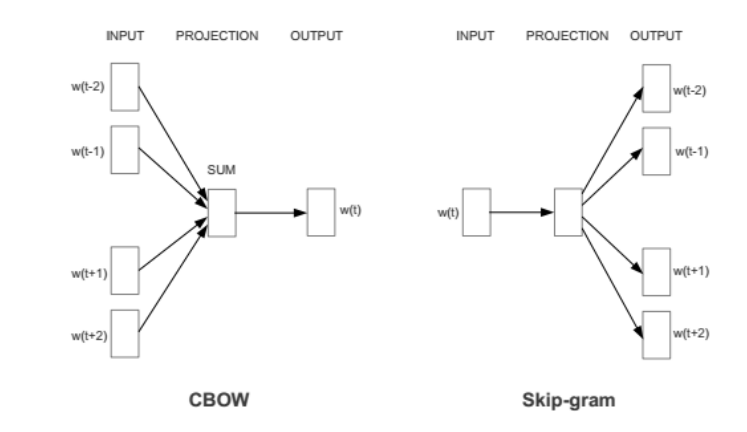

### CBOW (Continuous Bag Of Words)

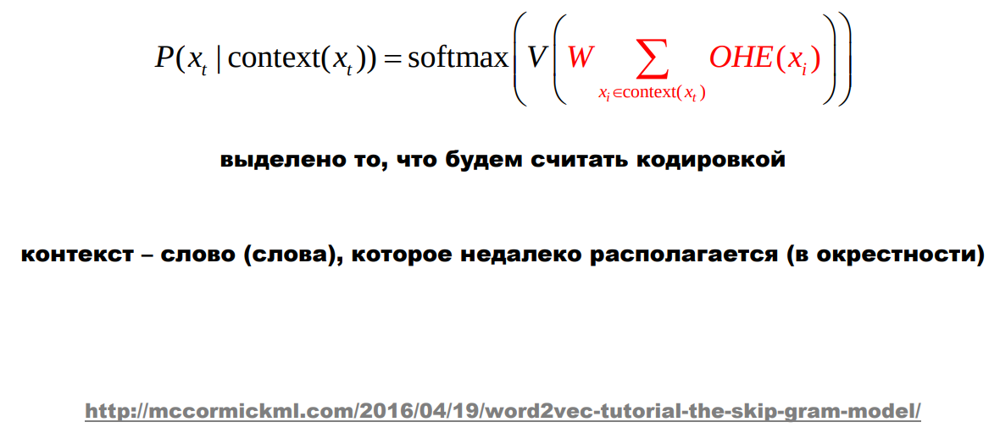

- predict word by context
- OHE - One-Hot Encoding
- word code representation is marked by red
- context - word/words that are situated nearby

### CBOW model

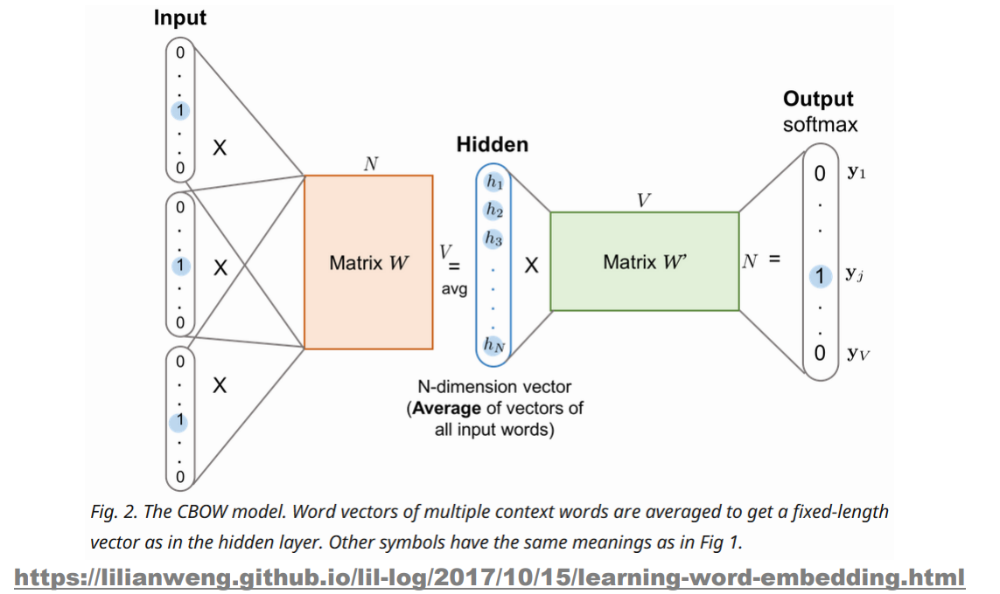

### skip-gram

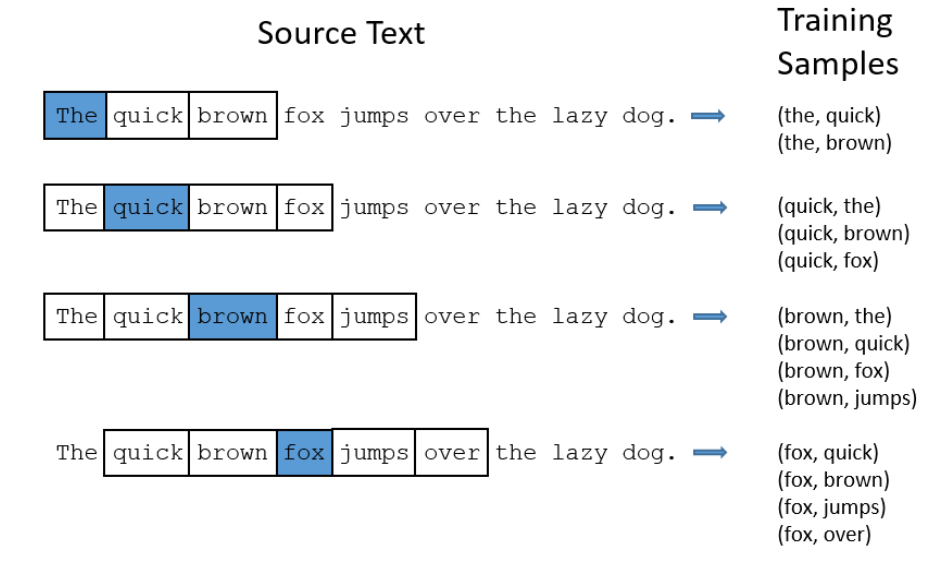

- predict context by word

### skip-gram model

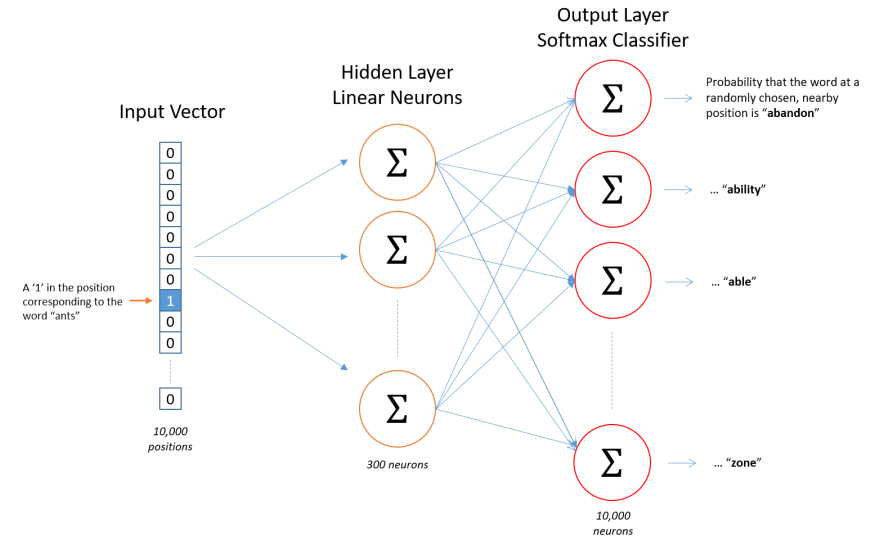

- input: OHE
- hidden layer: vector word representation
- output: word probabiltity distribution

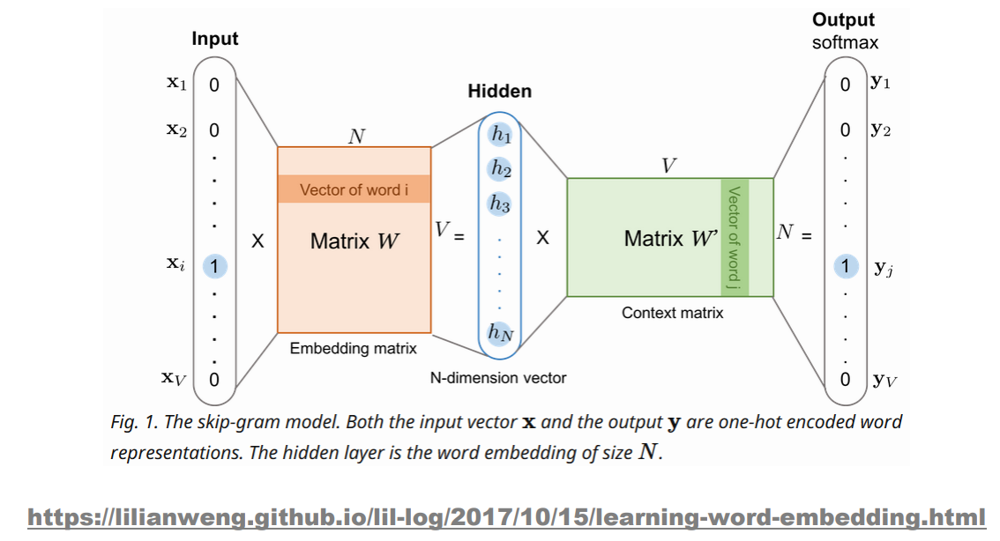

Word code is W_row (row of matrix W) or W_row + W'_row

### How to train word2vec?

Main problem of word2vec is huge NN: first layer = number_of_words x representation_dimensiality (e.g. 50000 x 300).
How to handle this?

- consider frequent phrases as one word: bad_habits, toxic_relations, white_spunner_construction
- select frequent word not so frequently 
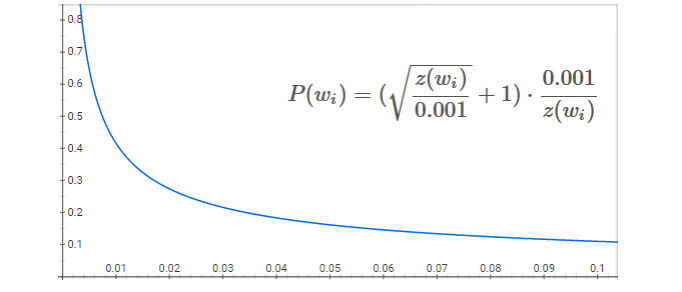
dependence between probability (P(w<sub>i</sub>), y-axis) and frequency (z(w<sub>i</sub>), x-axis)
- negative sampling

### Negative sampling

word2vec likelihood for x<sub>1</sub>, ... x<sub>T</sub>

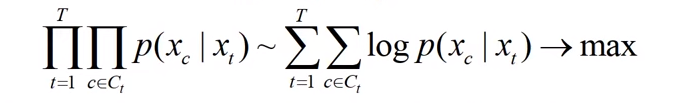

where

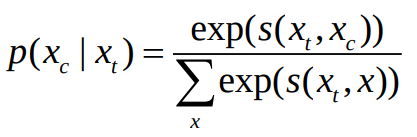

x<sub>t</sub> - vector of word (matrix W)

x<sub>c</sub> - vector of context (matrix W')

for word2vec we can use negative-likelihood

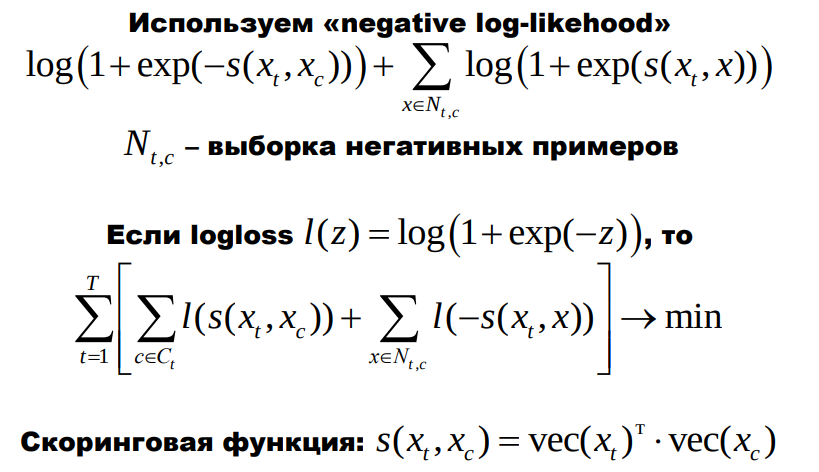

Negative sampling point is do not select all word from dictionary, but randomly select N words (e.g. N=20) and them in our loss function. With high degree of probability all of these word will have negative scoring function s(x<sub>t</sub>, x<sub>c</sub>)

Additional idea: do not select words randomly but select them according to their frequency

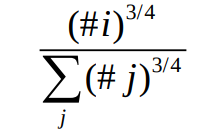

Where #i - word frequency, #j - frequencies of other words. This works better.

### Hierarchial softmax

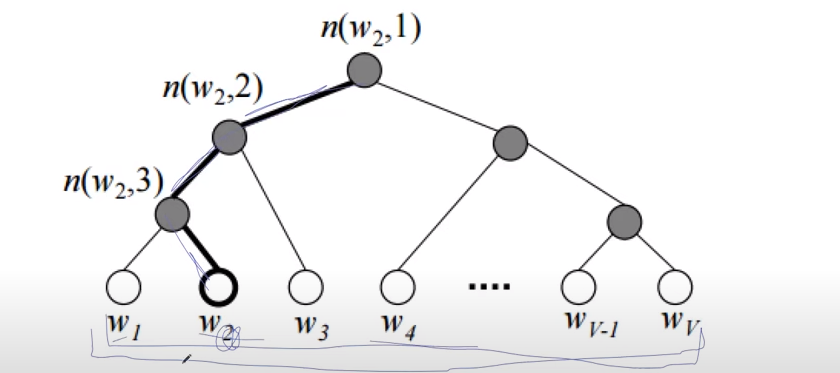

leaves of tree - words

probability - multiplication of all edges that lead to current leave

Can be use for fast softmax calculation

# fasttext

Main idea: word2vec + ngrams.

fasttext procedure

- convert words to ngrams: where ~ <wh, whe, her, ere, re>
- calculate hash for every ngram
- word code = sum of word's ngrams codes

Fasttext helps to solve problem of new words.

# Glove: global vectors

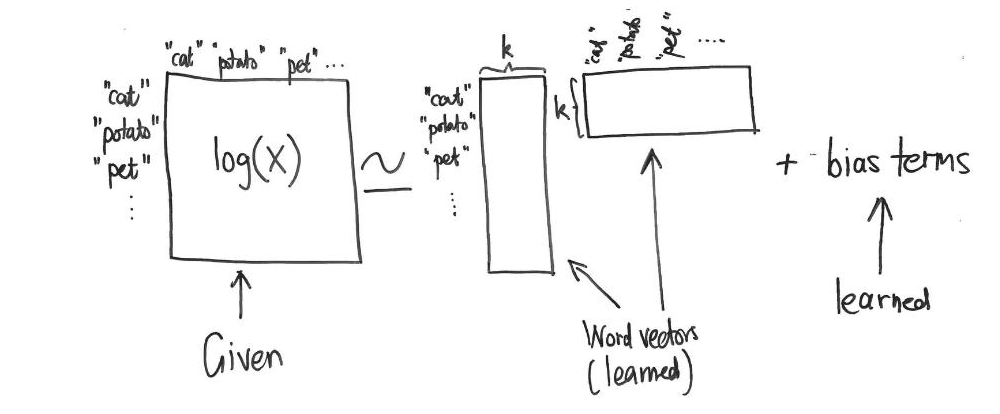

Main idea: decompose pair word frequency matrix on two word vectors

log(x) - logarithm of pair frequency of one word (row) in context of other word (column)

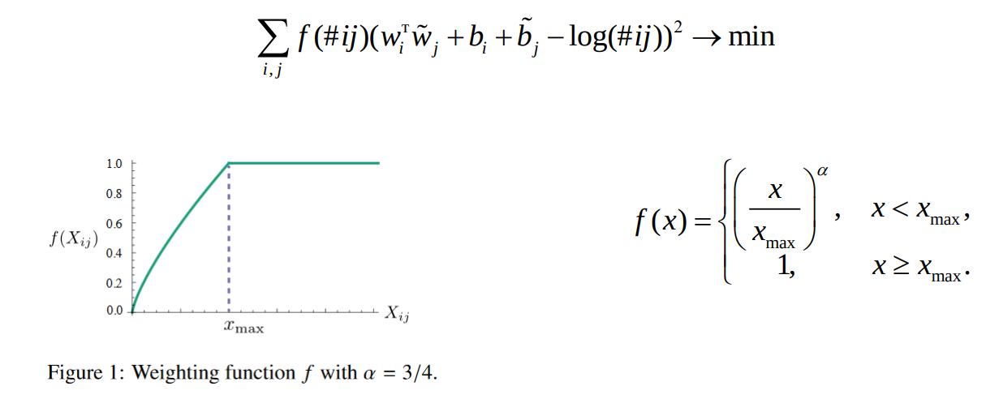

#ij - number of times when word j was met in the context of word i

b<sub>i</sub> and b<sub>j</sub> - biases

# What is the main disadvantage of all previous representations?

They don't take context in account:

The **bank** will not be accepting cash on Saturdays
The river overflowed the **bank**

Same word bank but with compeletely different meaning and in compeletely context.

# TagLM

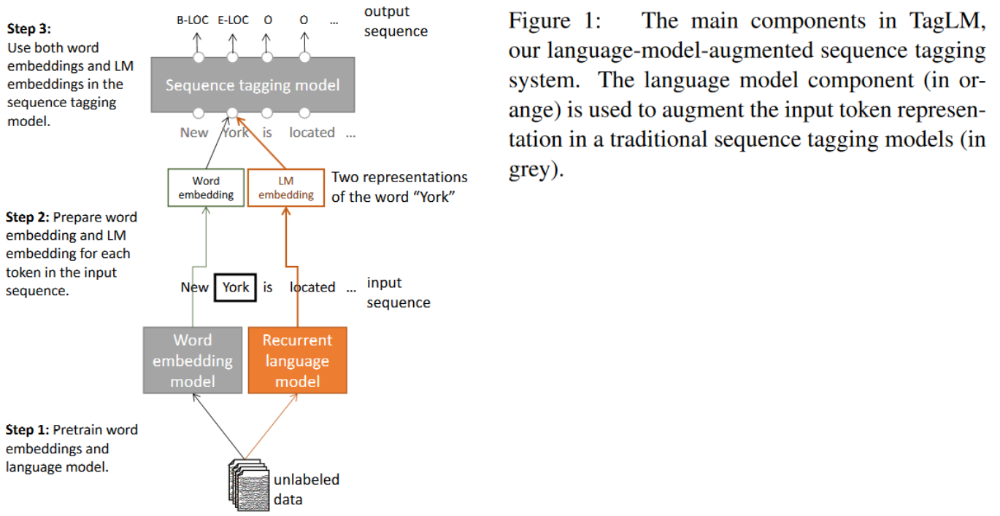

Use word embeddings + pretrained NN model

# CoVe (Contextual Word Vectors)

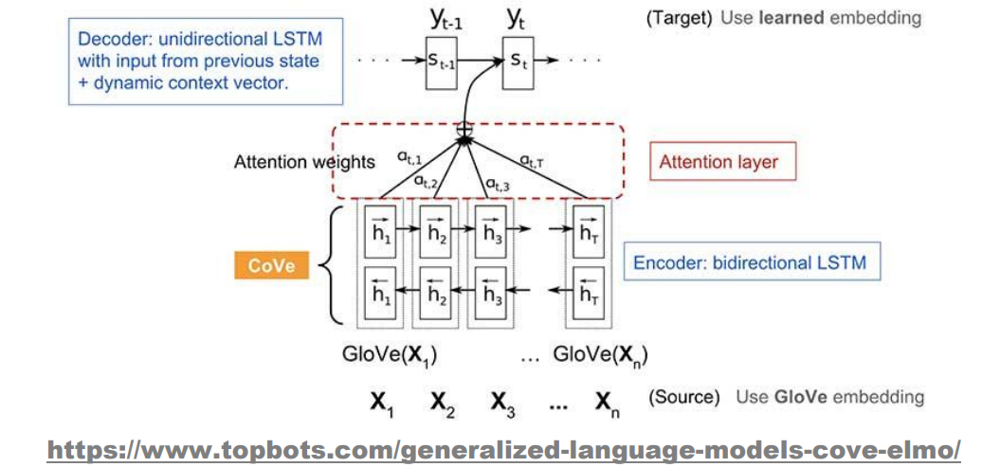

Main idea: train NN (like seq2seq with attention) for translation, then use encoder of that NN to encode words.

Preliminary GloVe word embedding can be used.

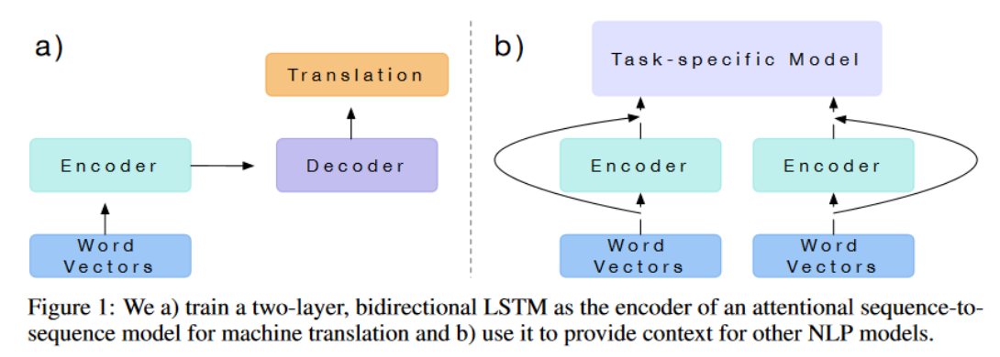

### CoVe results

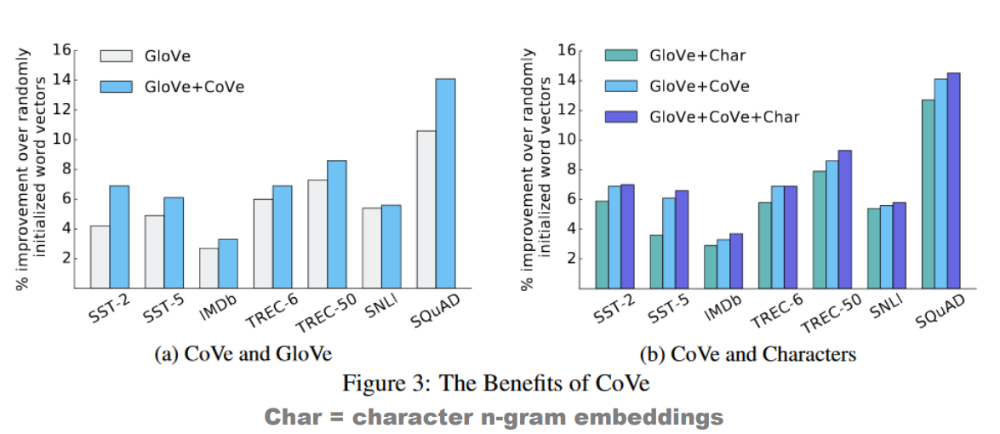

Results are not outstanding, maybe because machine translation is more complex task than language modeling.

# ELMo (Embeddings from Language Models)

Uses bidirectional language model

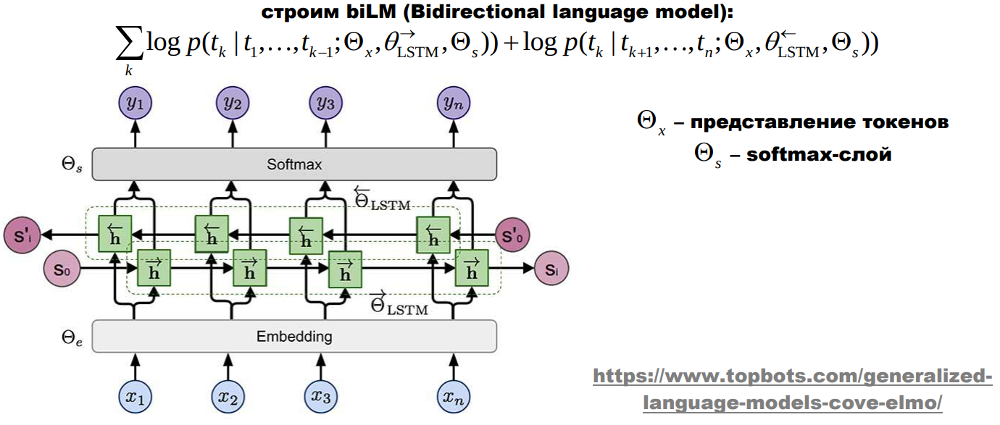

Main idea: train multilayer Bi-LSTM model and use linear combination of word representation from each layer to create vector embedding

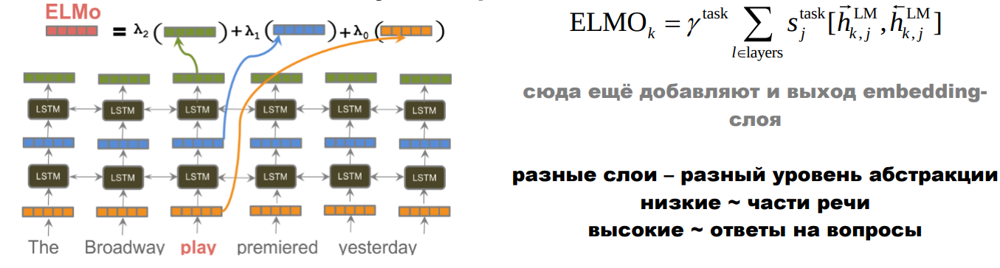

Different layers can give different levels of abstraction

- low layers - tags for parts of speech
- higher layers - answers on questions

### ELMo vs GloVe

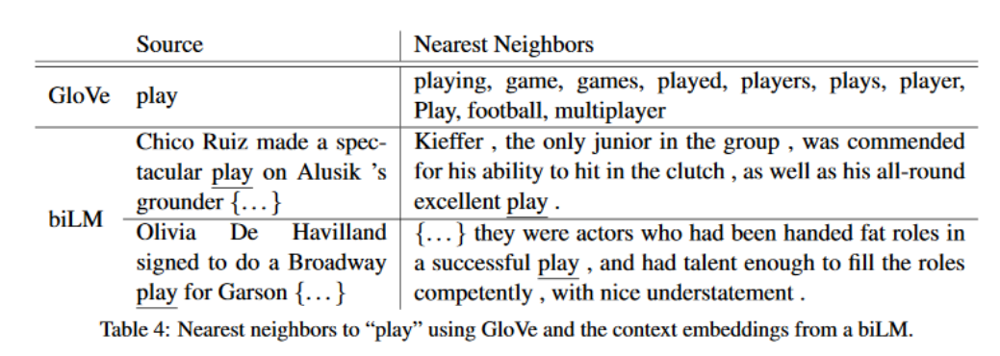

# FLAIR: Contextual String Embeddings for Sequence Labelling

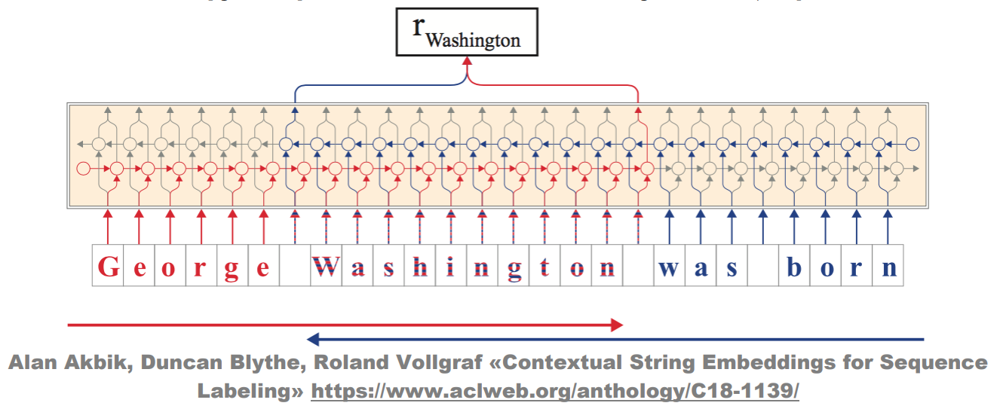

Train bidirectional character-level LM. For every word concatenate hidden state of LM representation for the first character of the word and the last character of the word (first part of bidir model read all sentence text to the left of the last character of the word, second part - all sentence text to the right of the first character of the word)

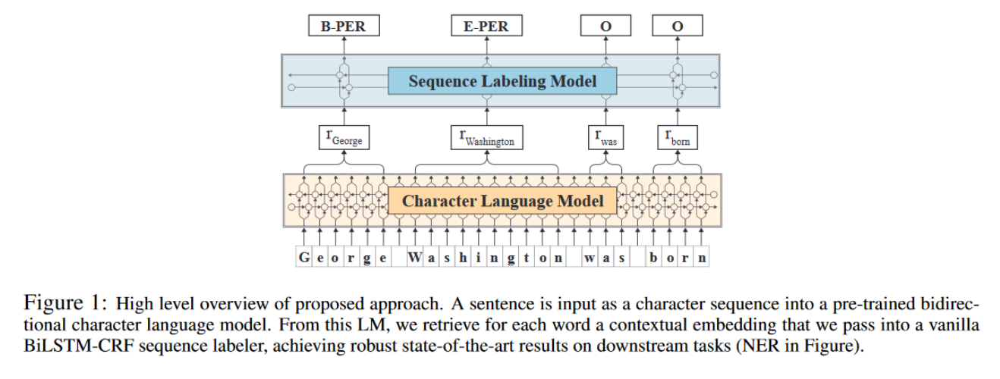

Can be used as encoder for high-level models (like Sequence Labeling Model).

# Text representation

# Siamese nets

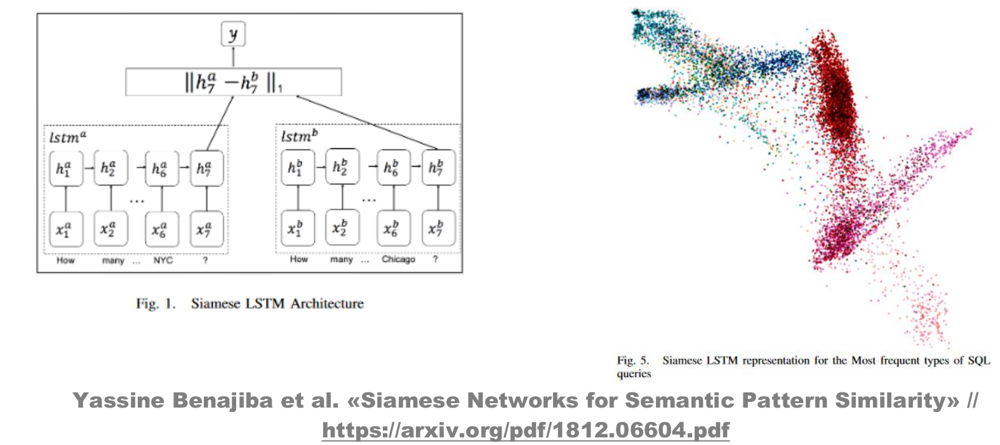

Universal approach when similarity/dissimilarity of text pairs exists

Use two same LSTM with shared weights and minimize distance between similar texts and maximize of not similar.

# Doc2Vec

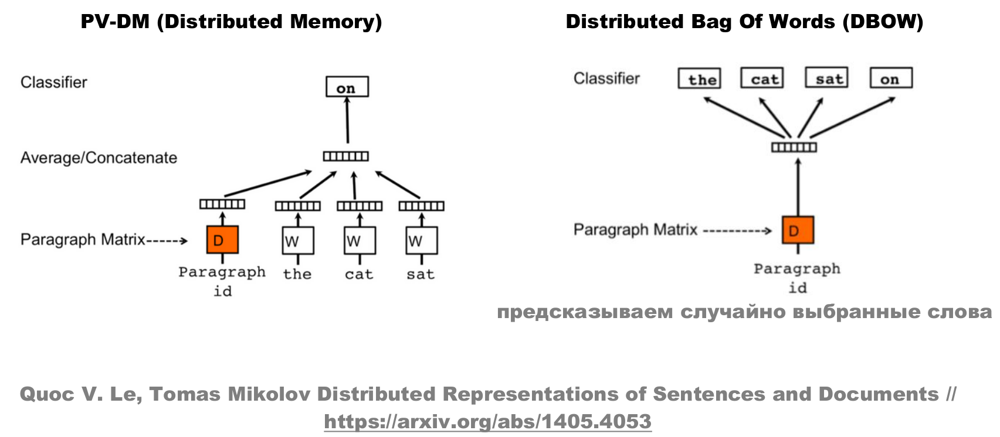

Similar to word2vec but also use Paragraph matrix to predict word not only from it's context but also from the whole paragraph context (Paragraph Vector Distributed Memory (PV-DM)). 

Another approach is to predict random words that may be in this paragraph by paragraph matrix (Distributed Bag Of Words (DBOW))

# skip-thoughts model

Main idea: predict previous and next sentence by current sentence using RNN (GRU). 

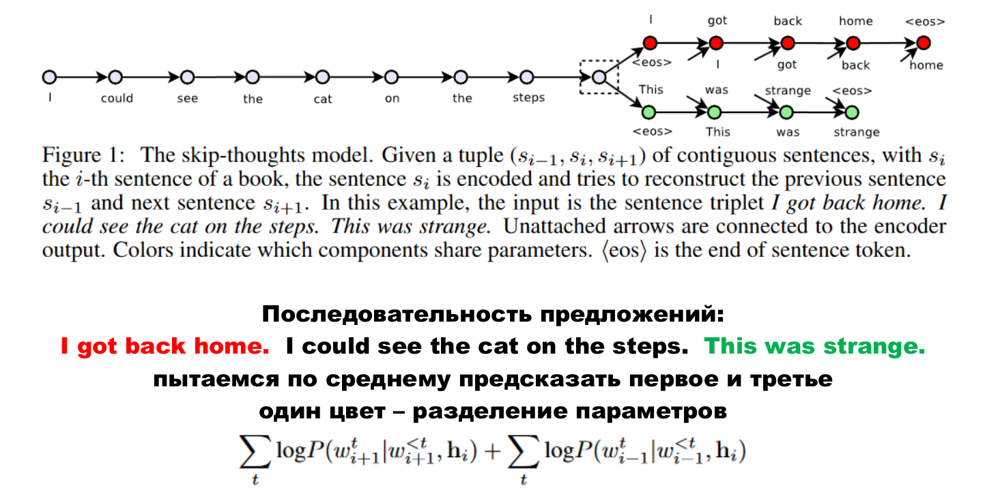

Coder-decoder scheme, works slow but quality is high.

# Autoencoder pretraining

Main idea: use autoencoder that was pretrained to reproduce input sequences for sentence encoding (with it's hidden state)

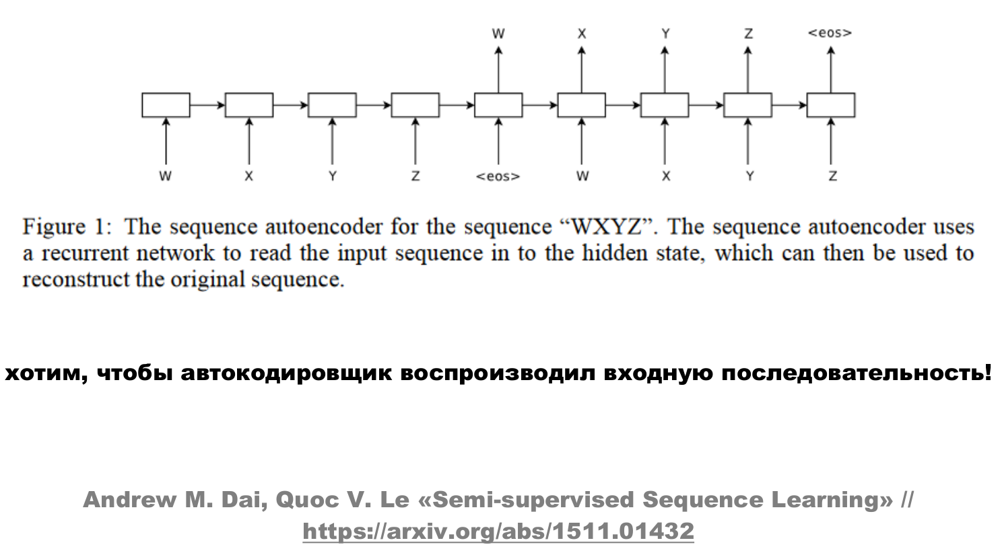


# StarSpace: anything to space

Main idea: operate with objects with features from some fixed feature set (e.g. word = set of n-grams, sentence = set of words, document = set of sentences, etc). Generate set of positive and negative pairs and try to build space where positive pairs will be close to each other and negative - not.

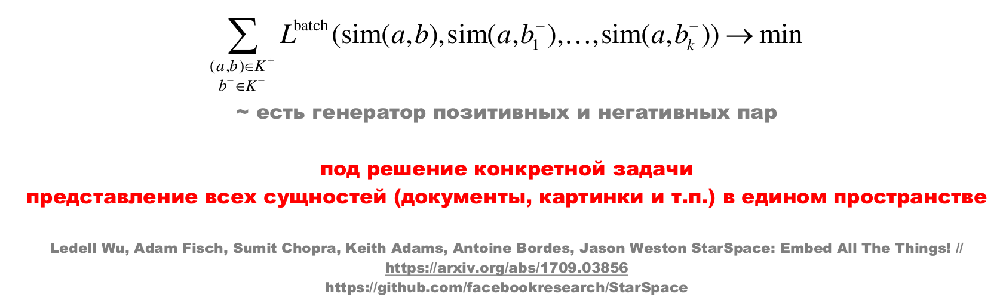



# DAN (deep average network)

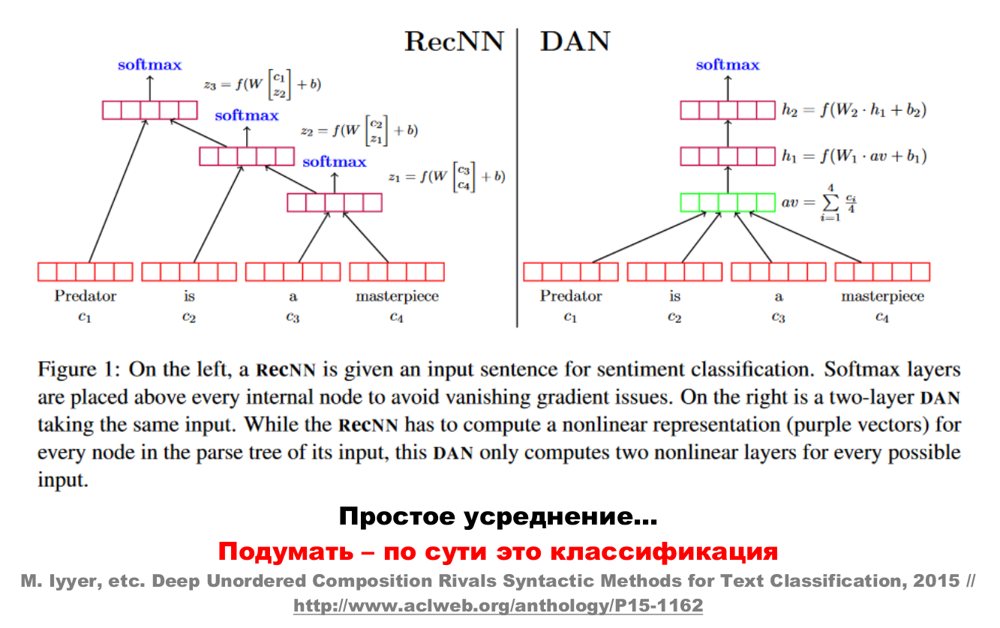

Simple averaging + classification to one of k labels

### How DAN works

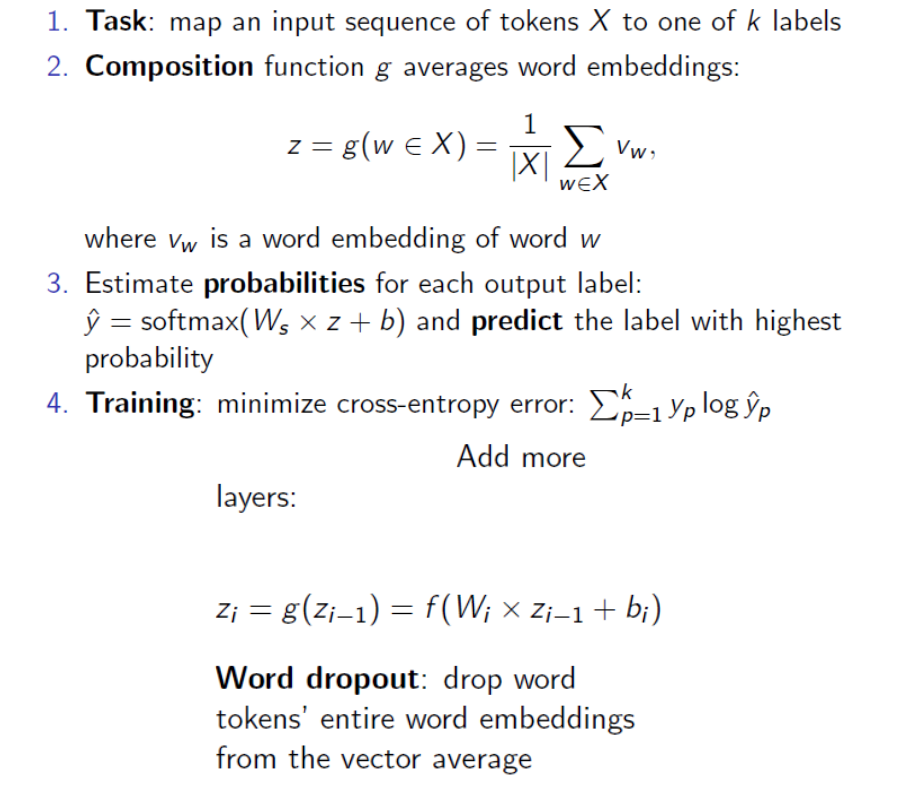

# Universal Sentence Encoder

Main idea: DAN + Transformer

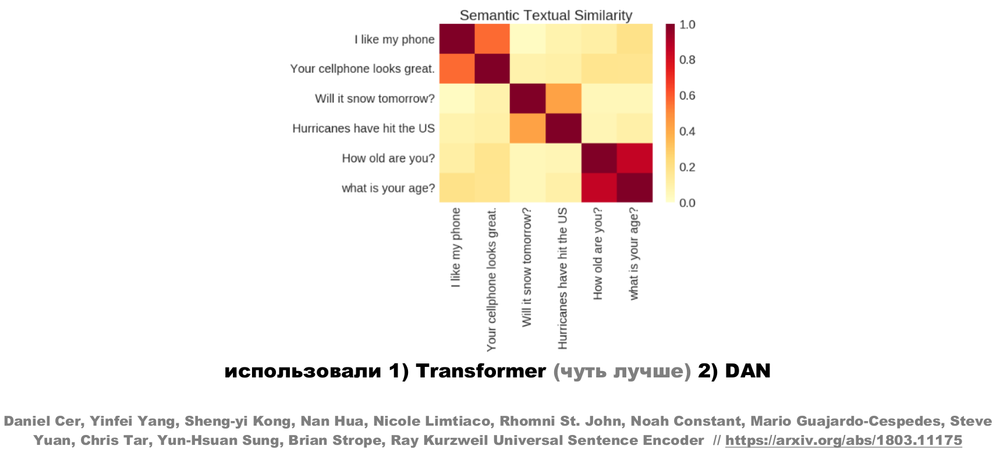

### Universal Sentence Encoder: Transformer architecture

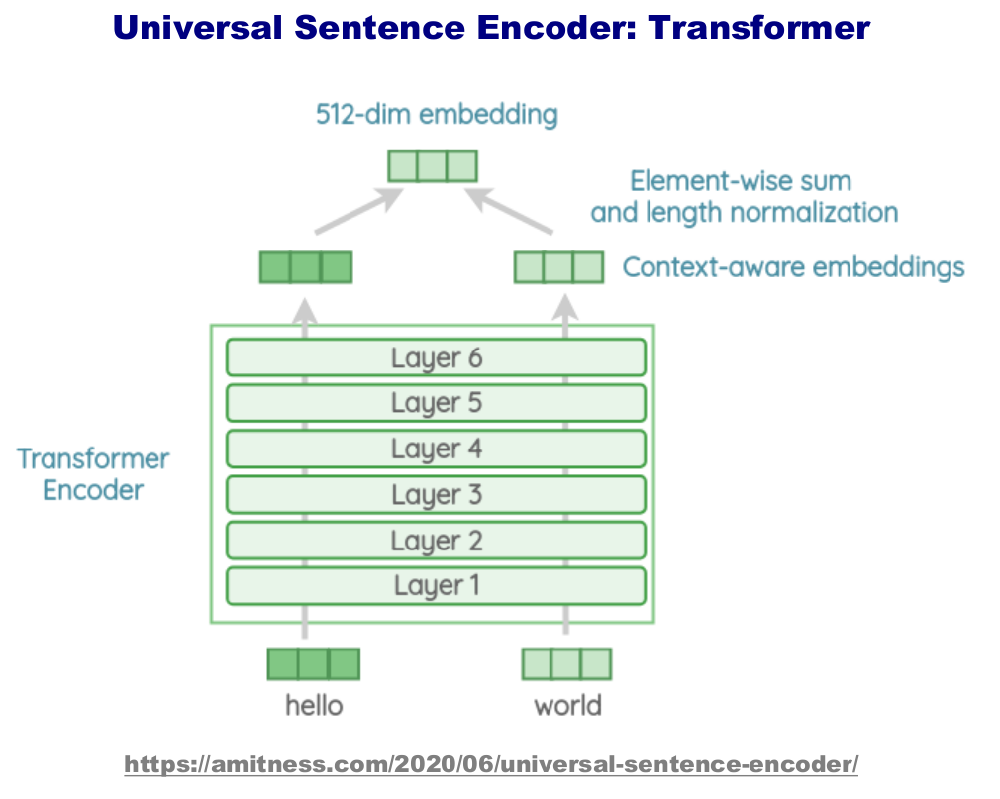

### Universal Sentence Encoder: DAN architecture

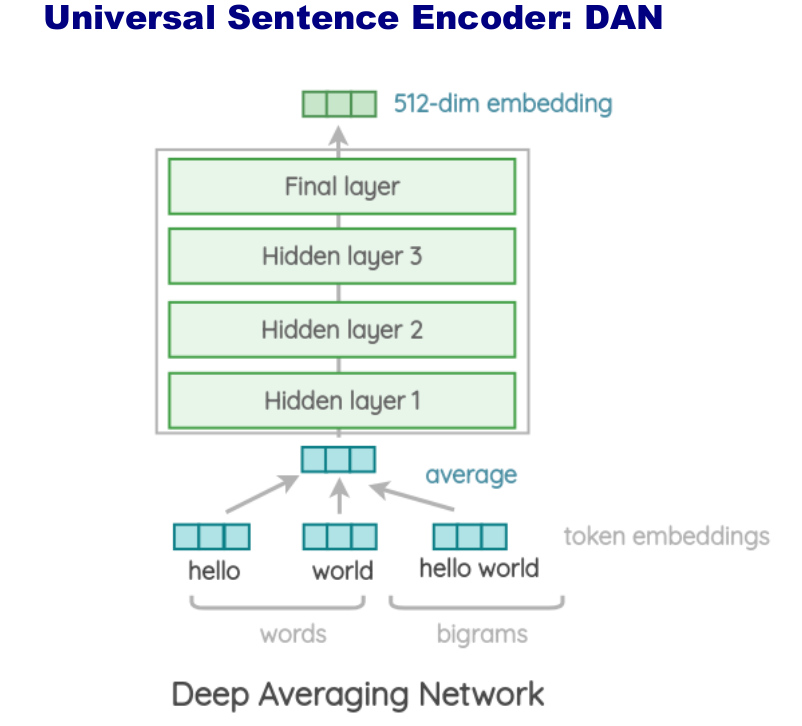

Use words and bigrams as inputs

### Universal Sentence Encoder: multi-task learning

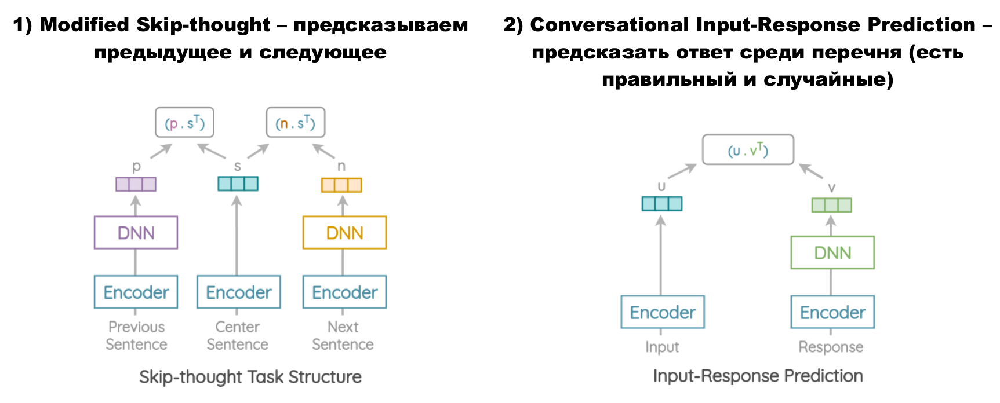

Train representation by solving **three tasks**:

- modified skip-thought

Instead of prediction of previous and next sentences (too complicated) just make vector product to be big for current sentence and prev/next sentences and small for current sentence and any other sentence. 

- conversational input-response prediction

Predict correct answer among incorrect ones (same principe: vector product for answer or relevant sentence must be big and must be small for all others)

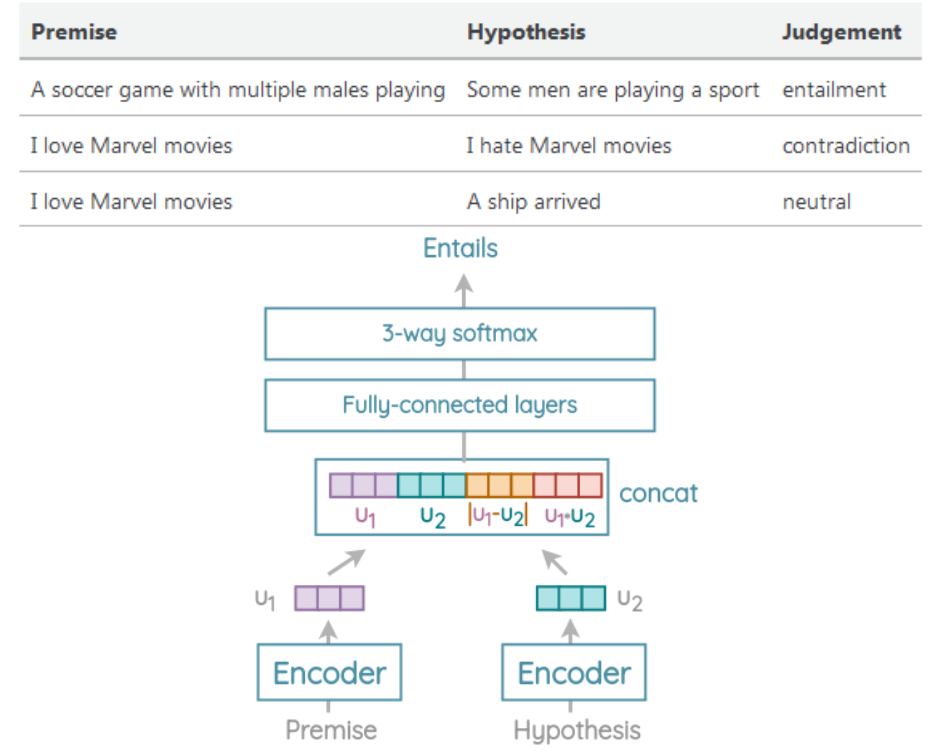

- natural language inference

Find if there is an entailment or contradiction between two sentences or they are neutral to each other. 

# DSSM - Deep Structured Semantic Model

Main idea: use siamese networks (pair of identical networks). 

First net takes query, second net - text. Goal is to find cosine distance between query embeddings and text embeddings and this distance must be small if query is relevant to the text and big in opposite case.

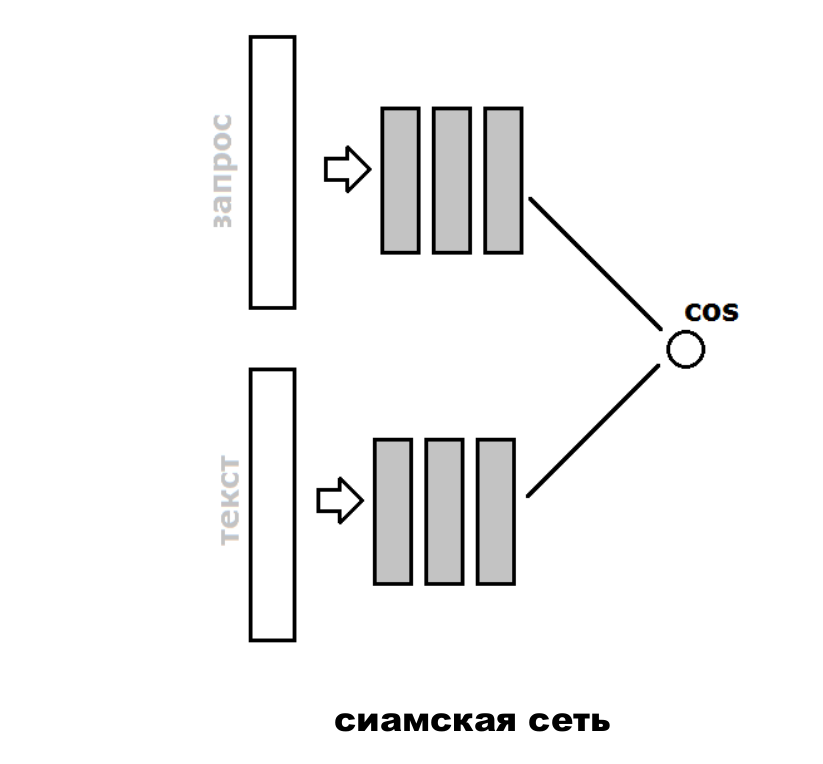

Input = words + ngrams (concatenation)

How to collect data:
- positive examples are easy to find
- negative examples:
  - some are taken randomly
  - some are taken from negative objects with high "+" probability

Links with more information and details:

[1](https://www.researchgate.net/publication/262289160_Learning_deep_structured_semantic_models_for_web_search_using_clickthrough_data)

[2 (russian)](https://habr.com/company/yandex/blog/314222)

# InferSent

Similar to conversational input-response prediction model from Universal Sentence Encoder (read above)

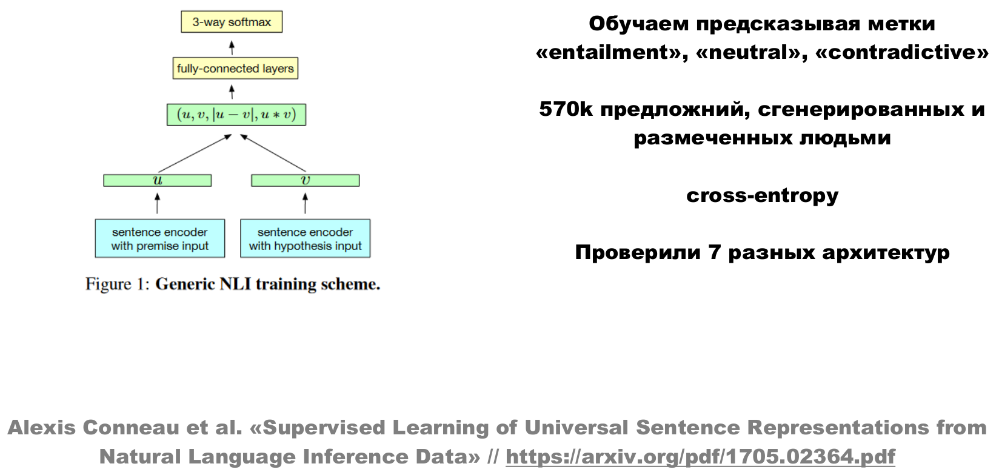



Try 7 different architechtures as sentence encoders. Here's results

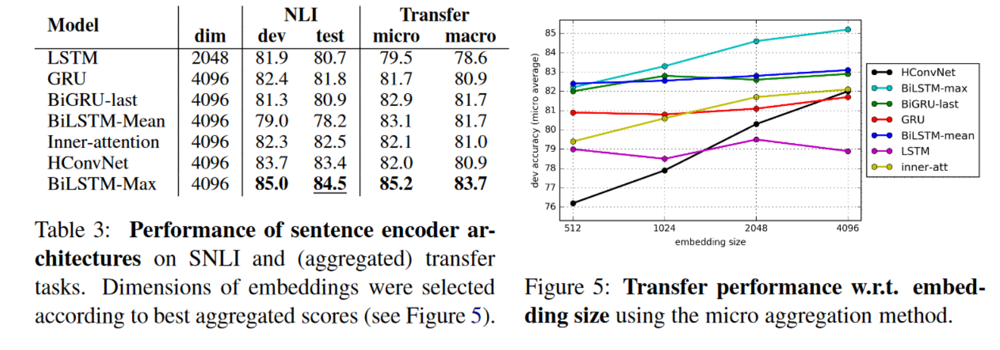

# SentenceBERT

Similar to InferSent but with BERT as sentence encoder

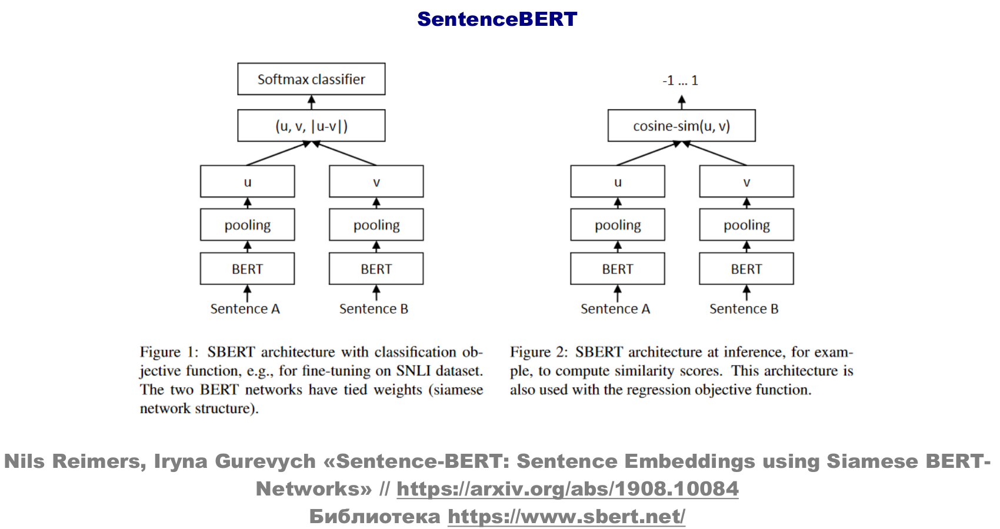



SBERT test results

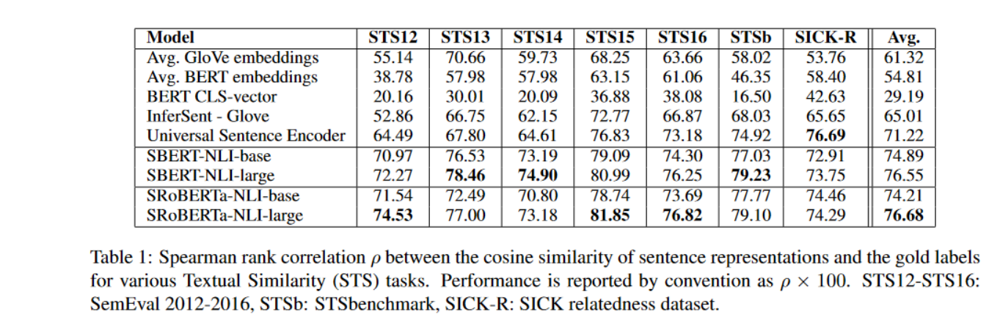

# Random Encoder

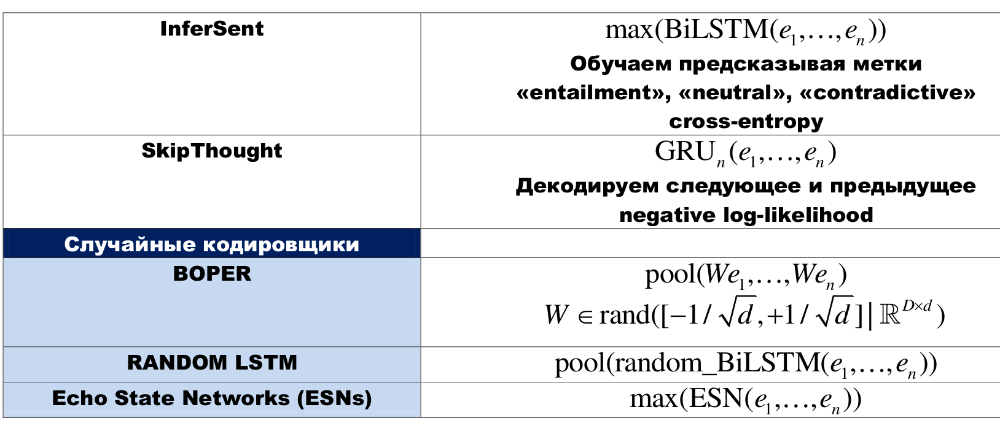

find sentence embedding having 

Task: find dentence embedding: h = F<sub>p</sub>(e<sub>1</sub>,... e<sub>n</sub>), e<sub>1</sub>,... e<sub>n</sub> - word embeddings. Train parameters p.

Main idea: instead of using complicate sentence encoders just use random encoders like BOPER, RANDOM LSTM, ESN, etc.

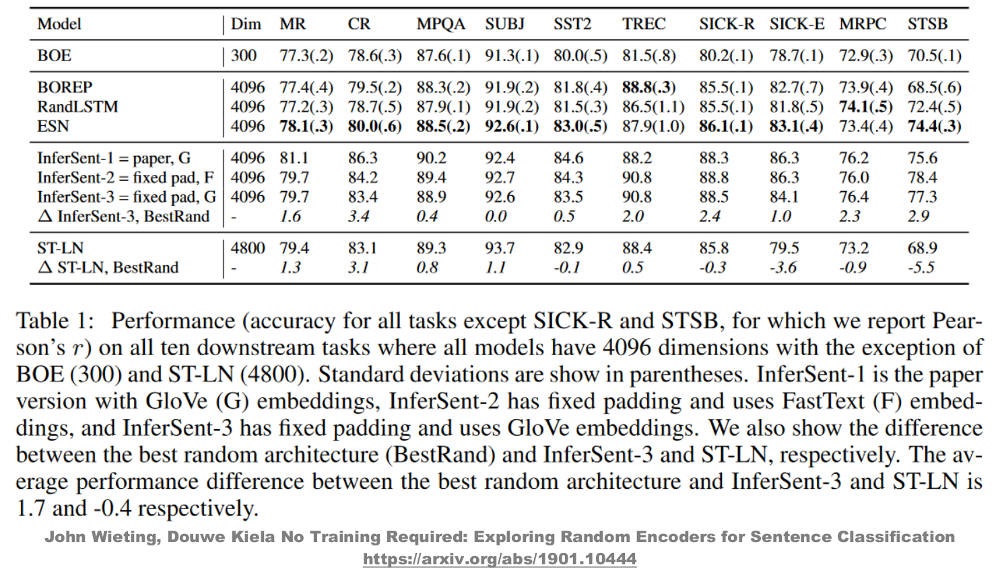

Comparing to complicate sentence encoders they are not much worse! So they can be used as baseline for sentence encoding.

# TSDAE

Main idea: pretrain transformer encoder-decoder without labels but with noise (delete words, swap words, mask, replace, add). Decoder takes vector of fixed length. So this model learns to endcode and than restore noised text.

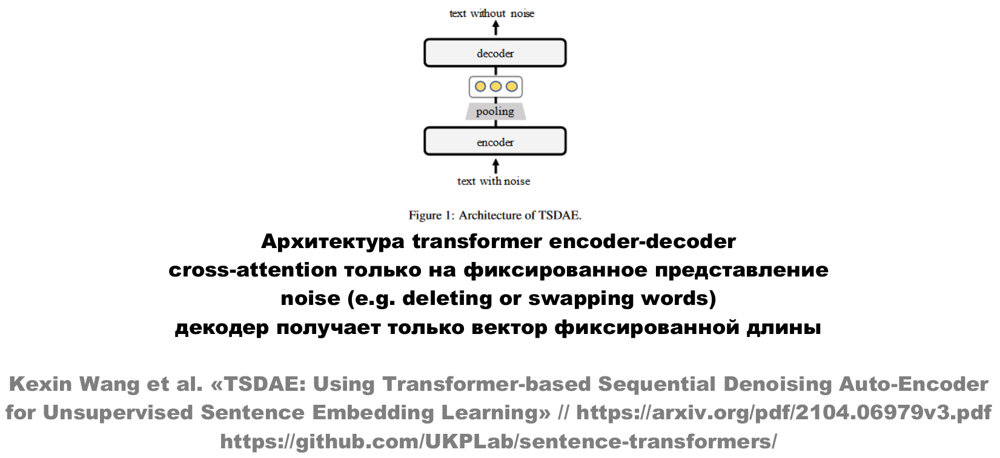

# BERTScore

How to compare sentences similarity? One of ways is SentenceBERT (read above) but BERTScore is better.

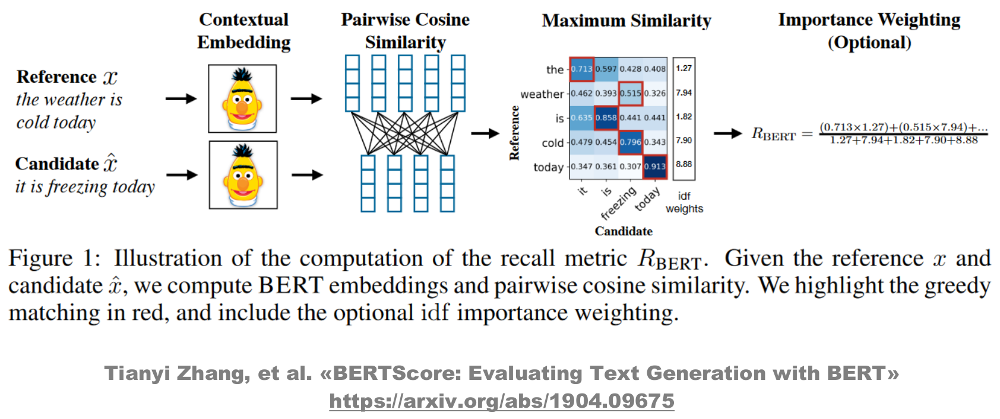

It takes 2 texts, builds word embeddings and than creates matrix of similarity between embeddings of first text and second text. Than it founds ratio between sum of must similar embeddings multiplied by their IDF (Inverse Document Frequency - high for words that are rare in current document set, but low for common words) and sum of their IDFs (look at picture).

# More info about embeddings

[Embeddings catalogue](https://github.com/Separius/awesome-sentence-embedding)

[More info about subtleties of the embedding methods](https://lilianweng.github.io/lil-log/2017/10/15/learning-word-embedding.html)

[Embeddings review](https://lena-voita.github.io/nlp_course)

[Good word2vec tutorial](http://mccormickml.com/2017/01/11/word2vec-tutorial-part-2-negative-sampling)
